# GAN

### Objective
In this activity, you'll create a **vanilla** Generative Adversarial Network (GAN). Specifically, you'll build and train a GAN that can generate images of handwritten digits from 0 to 9. You'll be using PyTorch for this notebook. If you're new to this framework, you can refer to the official [PyTorch documentation](https://pytorch.org/docs/stable/index.html).

### Learning Objectives
1.  Construct a GAN generator and discriminator.
2.  Define the loss functions for both the generator and the discriminator.
3.  Train the GAN and visualize the images it generates.

## First steps

You will start by importing some useful packages and the dataset you will use to build and train your GAN. You will also get a viewer function to help investigate the images that your GAN will create.


In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

### MNIST Dataset
The training images that your discriminator will be using come from the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset. It contains 60,000 images of handwritten digits from 0 to 9, like these:  
![MNIST Digits](https://th.bing.com/th/id/OIP.Ft2rLuO82eItlvJn5HOi9AAAAA?w=292&h=180&c=7&r=0&o=5&pid=1.7)

The MNIST images have low resolution, only 28x28, which makes them ideal for simple training. Additionally, these images also have only one dimension, or color channel.

### Tensor
You will use [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the pixel values of red, green, and blue at different points of a 64 x 64 pixel matrix is a tensor of *shape* 3 x 64 x 64.

Tensors are easy to manipulate and are supported by the [PyTorch](https://pytorch.org/) library. Tensors are multidimensional matrices or vectors.

### Batches

While you could train your model one training image at a time, this is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, multiple images are typically processed per training step. In other words, the images are trained in batches.

This means that your generator will generate an entire batch of images and receive *feedback* from the discriminator before updating the model. The same happens for the discriminator, which will calculate the loss on the whole *batch* of generated and real images before the model is updated.


## Generator

The first step will be creating a generator component (*Generator*).

You will start by creating a function to build a single layer/block for the generator neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another *shape*, a [*batch normalization*](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a nonlinear activation function (in this case we will use [ReLU](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so that the output can be transformed in complex ways.

Review the code and comments of the following function and follow the instructions.


In [ ]:
# Replace None by the correct dimensions
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [ ]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU

    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will receive 3 values:

* The noise vector dimension
* The image dimension
* The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Starting with the noise vector, the generator will apply nonlinear transformations through the block function until the tensor is mapped to the size of the image to be generated (the same size as the real MNIST images). You will need to fill in the code for the final layer, as it is different from the others. The final layer does not need normalization or an activation function, but it needs to be scaled with a [sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) function.

Finally, you are given a *forward* function that takes a noise vector and generates an image of the output dimension using your neural network.

Tips:
1. The output size of the last linear transformation should be `im_dim`, but remember that you must scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) can be helpful here.

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them!
            #### START CODE HERE ####
            nn.Linear(8 * hidden_dim, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)

    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [ ]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you’ll need to create noise vectors. The noise vector *z* plays the important role of ensuring that generated images of the same class don’t all look identical—think of it as a random seed. You’ll generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you’ll generate all the noise vectors at once.

Note that whenever you create a new tensor using `torch.ones`, `torch.zeros`, or `torch.randn`, you’ll need to create it on the target device, e.g., `torch.ones(3, 3, device=device)`, or move it to the target device using `torch.ones(3, 3).to(device)`. You don’t need to do this if you’re creating a tensor by manipulating another tensor or using a variant that sets the device to match the input by default, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` whenever possible.

You will likely find `torch.randn` useful here.


In [ ]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [ ]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)

    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component you need to build is the discriminator. Just like with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: Here we use leaky ReLUs to avoid the “dying ReLU” problem, which refers to the phenomenon where parameters stop changing due to consistently negative values being passed to a ReLU, resulting in a zero gradient.*


In [ ]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation
          followed by an nn.LeakyReLU activation with negative slope of 0.2
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2)
        #### END CODE HERE ####
    )

In [ ]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)

    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to build a discriminator! The discriminator class has 2 values:

* The image dimension
* The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimensional tensor) as output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid function after the output layer, as it is included in the loss function. Finally, to use your discriminator’s neural network, you are given a *forward* pass function that takes an image tensor to be classified.


In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor,
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [ ]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):

    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put everything together!

First, you’ll set your parameters:
  * **criterion**: the loss function  
  * **n_epochs**: the number of times you go through the entire dataset during training  
  * **z_dim**: the dimension of the noise vector  
  * **display_step**: how frequently to display/visualize images  
  * **batch_size**: the number of images per forward/backward pass  
  * **lr**: the learning rate  
  * **device**: the device type, here using a GPU (which runs CUDA), not CPU

Next, you’ll load the MNIST dataset as tensors using a dataloader.


In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

100%|██████████| 9.91M/9.91M [00:00<00:00, 18.8MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 495kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.71MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 9.69MB/s]


Now you can initialize your generator, discriminator, and optimizers. Note that each optimizer should take only the parameters of a specific model, because we want each optimizer to optimize only one of the models.


In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before training your GAN, you’ll need to create functions to calculate the discriminator loss and the generator loss. This is how the discriminator and generator will know how they’re performing and improve themselves. Since the generator is required when calculating the discriminator’s loss, you’ll need to call `.detach()` on the generator’s output to ensure that only the discriminator is updated!

Remember that you already defined a loss function earlier (`criterion`), and it’s recommended to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you’ll need to pass `device=device` to them.


In [ ]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare
               the discriminator's predictions to the ground truth reality of the images
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce,
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images.
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a
    #            'ground truth' tensor in order to calculate the loss.
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise_vector = get_noise(num_images, z_dim, device=device)
    fake_images = gen(noise_vector)
    disc_fake_predictions = disc(fake_images.detach())
    disc_fake_loss = criterion(disc_fake_predictions, torch.zeros_like(disc_fake_predictions))
    disc_real_predictions = disc(real)
    disc_real_loss = criterion(disc_real_predictions, torch.ones_like(disc_real_predictions))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [ ]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)

    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data

        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [ ]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare
               the discriminator's predictions to the ground truth reality of the images
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce,
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images.
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise_vector = get_noise(num_images, z_dim, device=device)
    fake_images = gen(noise_vector)
    disc_fake_predictions = disc(fake_images)
    gen_loss = criterion(disc_fake_predictions, torch.ones_like(disc_fake_predictions))
    #### END CODE HERE ####
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)


def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)

    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


**Finally**, you can put everything together! For each epoch, you will process the entire dataset in *batches*. For each batch, you will need to update the discriminator and the generator using their respective losses. *Batches* are sets of images that will be predicted before the loss functions are calculated (instead of calculating the loss after each image). Note that you may see a loss greater than 1—this is normal, since the binary cross-entropy loss can be any positive number for a sufficiently confident wrong prediction.

It is common for the discriminator to outperform the generator, especially at the beginning, because its task is easier. It is important that neither of them becomes too good (i.e., with near-perfect accuracy), as that would cause the whole model to stop learning. Balancing the two models is actually very difficult to achieve in a standard GAN and typically requires some experimentation.

After you submit a functional version with the original architecture, feel free to play with the architecture if you want to see how different design choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension or making the networks shallower or deeper by adjusting the number of layers.

You should expect to see approximately this progression. On a GPU, this should take about 15 seconds per 500 steps on average, while on a CPU it will take roughly 1.5 minutes:

![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3947943718433389, discriminator loss: 0.4180265241265294


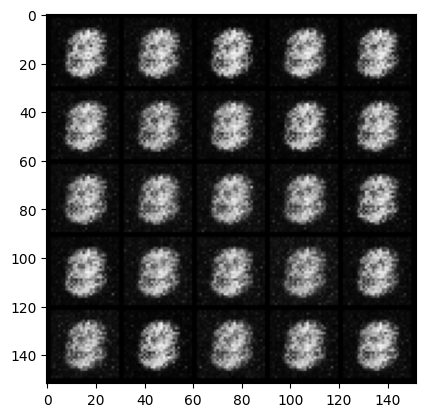

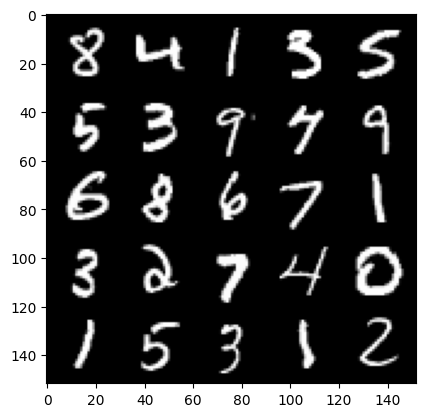

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.7517472405433654, discriminator loss: 0.27986072152853014


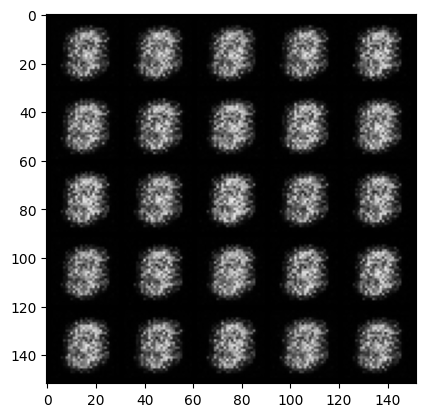

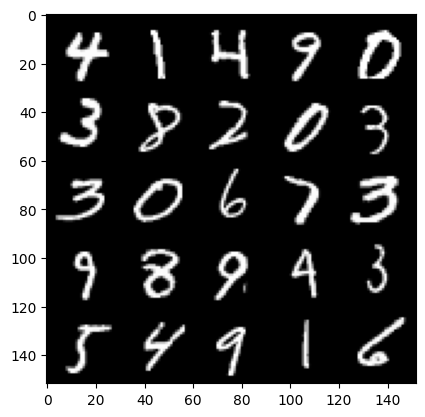

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.0689964554309825, discriminator loss: 0.1577542190402747


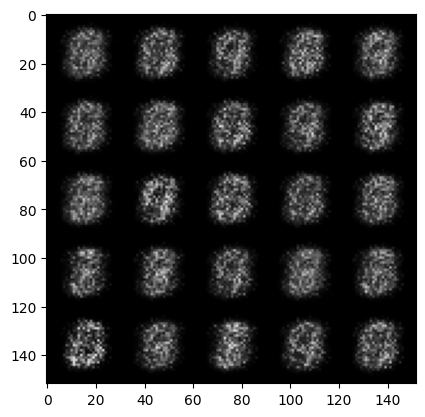

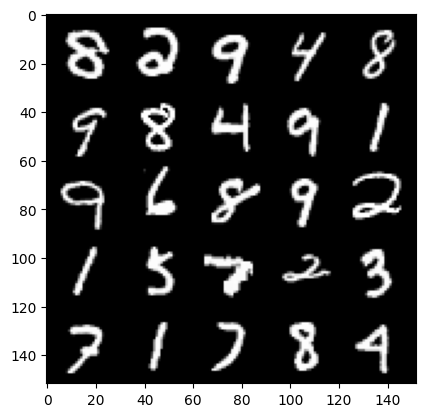

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.676320251464843, discriminator loss: 0.22532069537043553


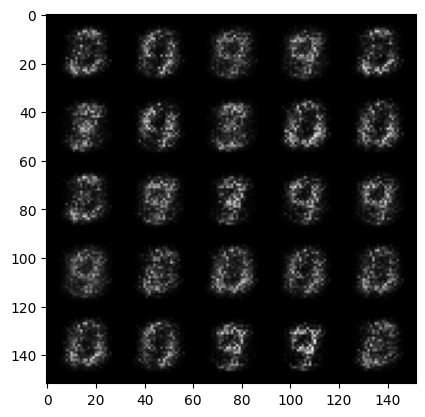

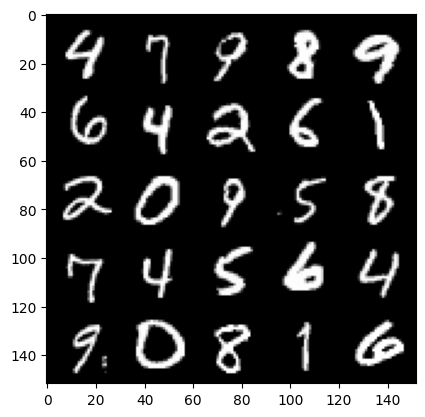

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.672541620016097, discriminator loss: 0.20628717198967936


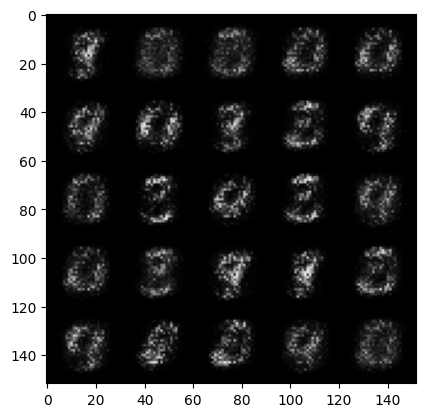

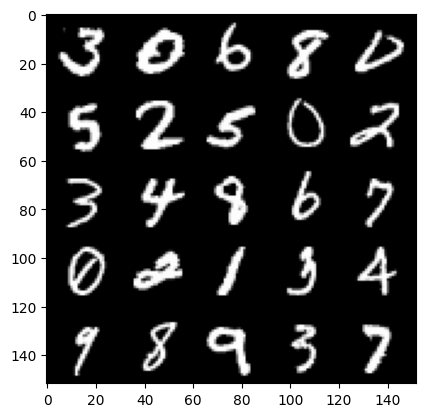

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.876441504240037, discriminator loss: 0.17904327014088608


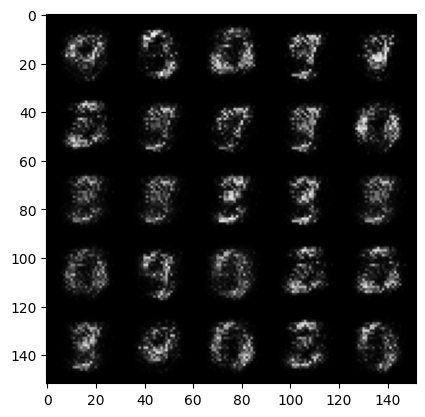

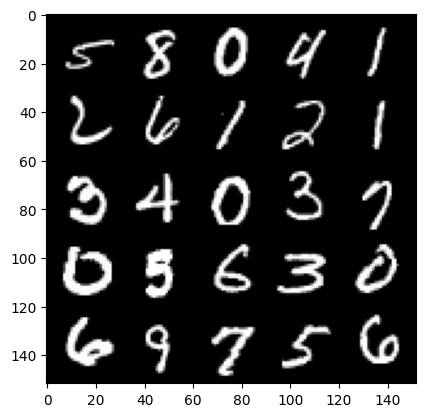

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.2994396350383757, discriminator loss: 0.14107516816258436


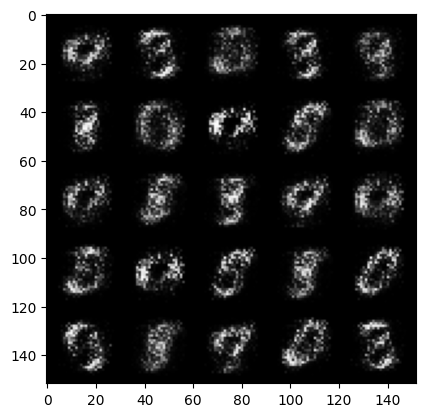

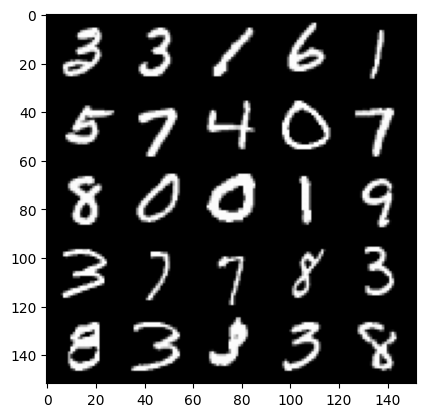

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.6702361288070695, discriminator loss: 0.11391525447368617


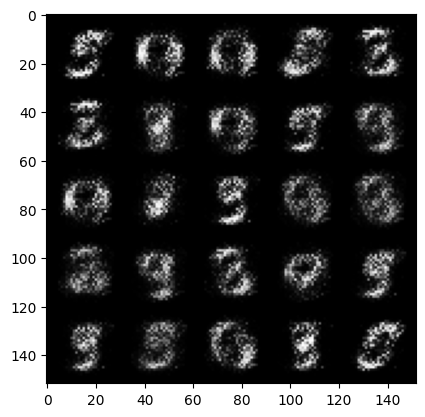

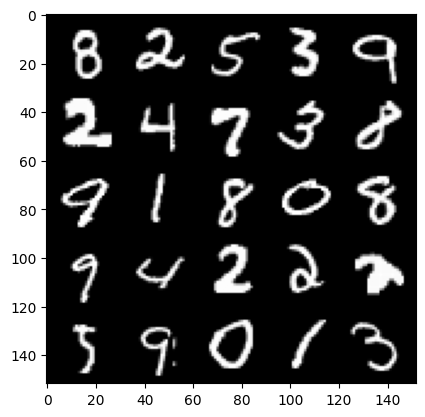

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.1311520891189537, discriminator loss: 0.08491147681325681


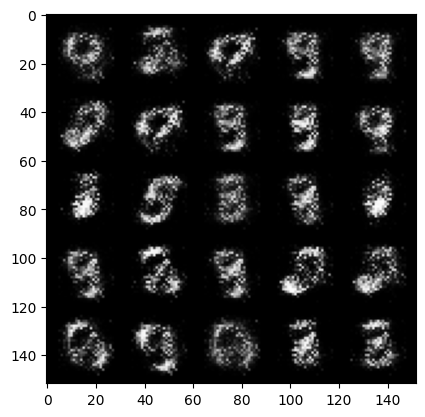

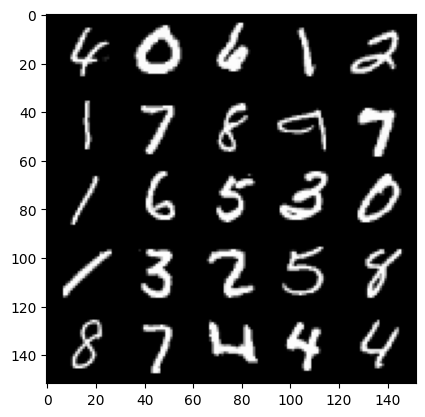

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.5781778011322016, discriminator loss: 0.06509942352026703


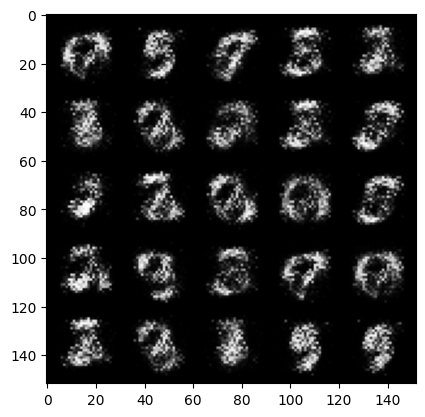

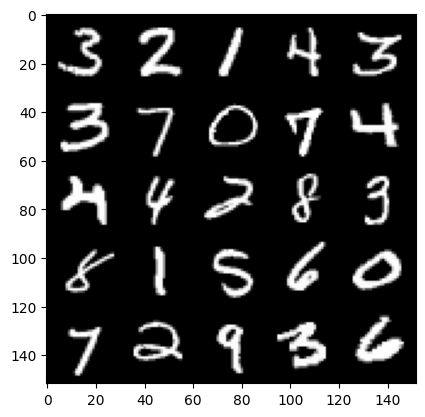

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.7200401868820197, discriminator loss: 0.05598391816765066


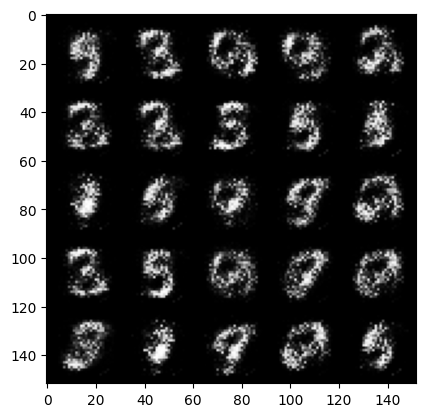

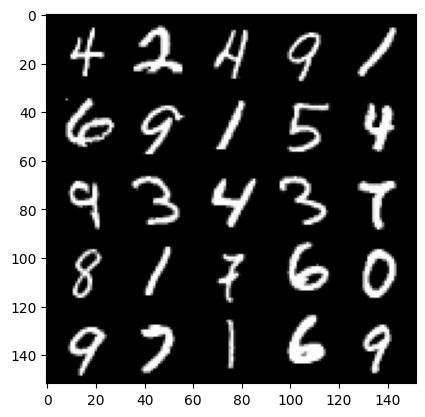

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 4.08811605644226, discriminator loss: 0.050943452212959546


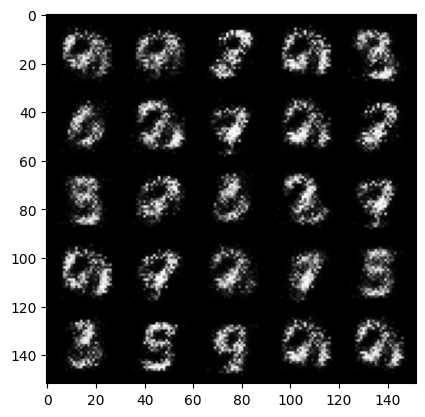

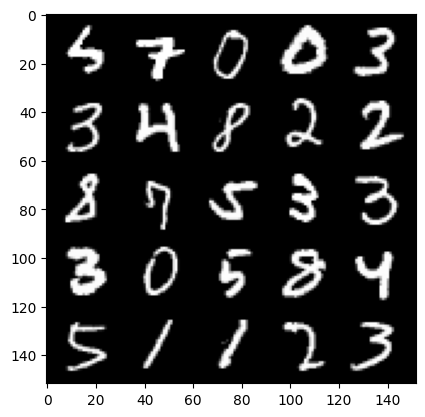

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.9948664531707814, discriminator loss: 0.053879345349967446


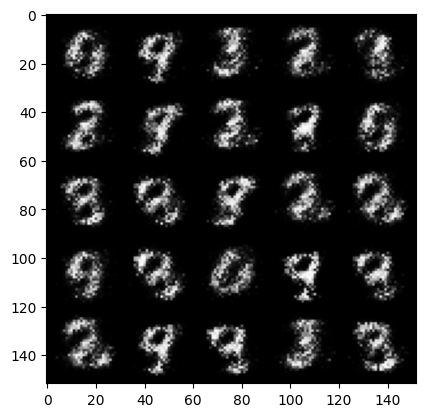

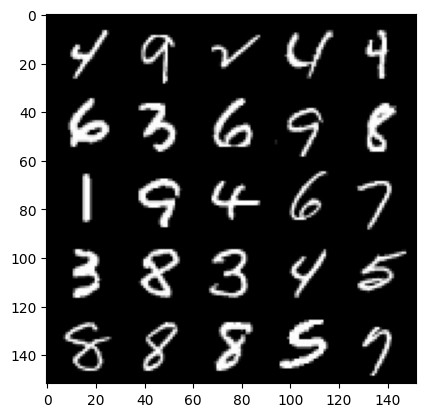

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.17760966873169, discriminator loss: 0.04340205736458303


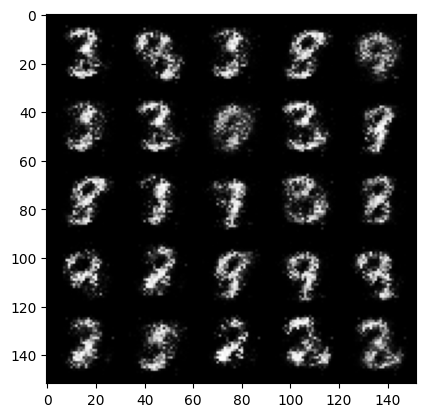

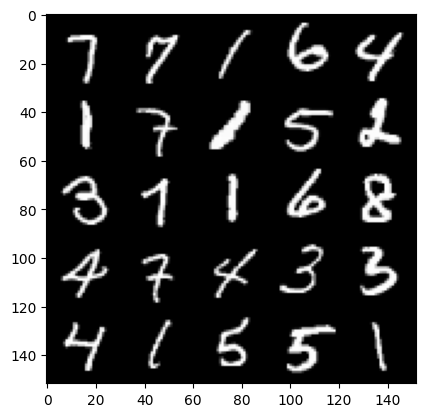

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.362485014915466, discriminator loss: 0.04437266986444593


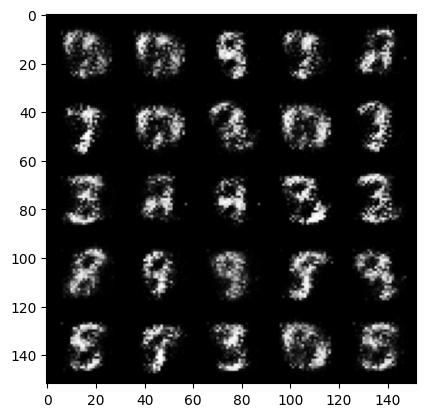

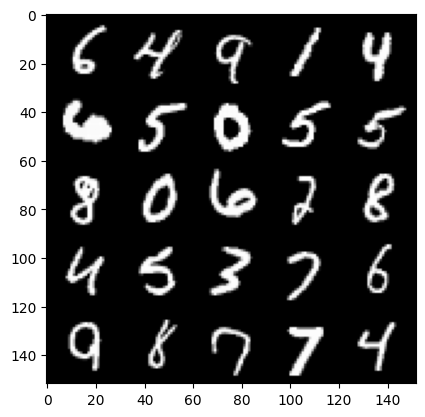

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.278584886074065, discriminator loss: 0.06185170092433693


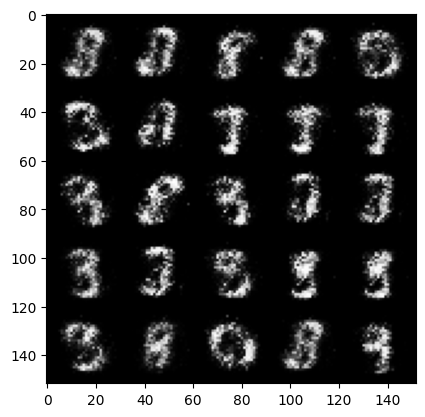

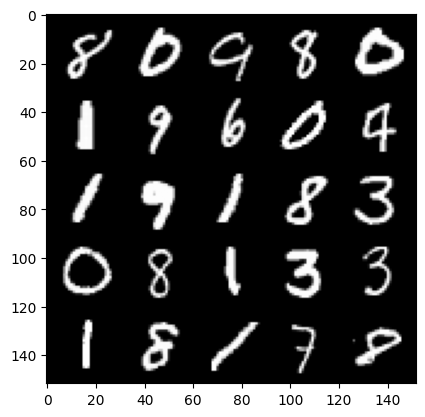

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.459564106941224, discriminator loss: 0.05022648405283685


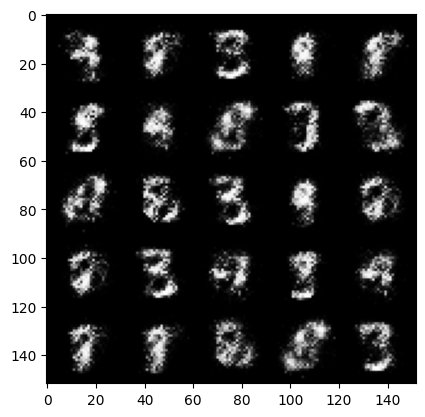

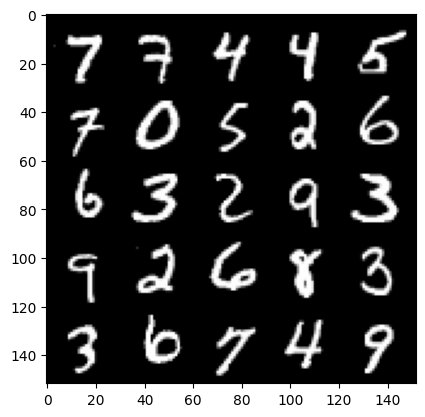

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.513160923957825, discriminator loss: 0.047879125677049175


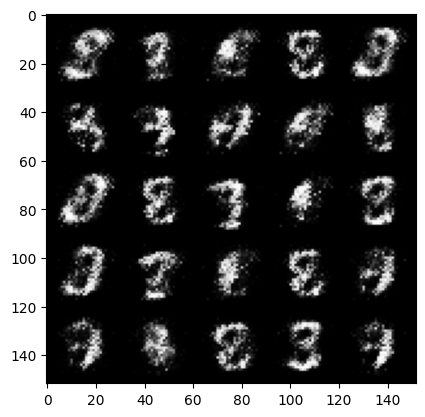

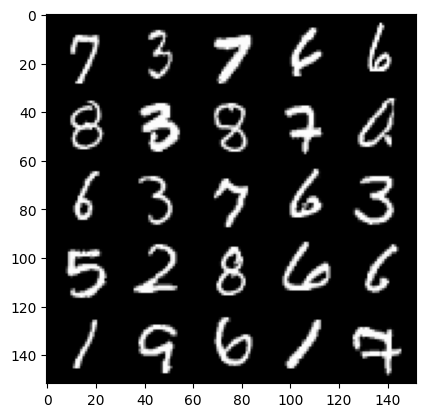

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.73097288131714, discriminator loss: 0.040930413439869875


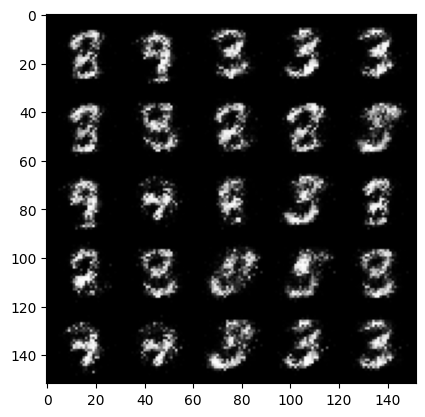

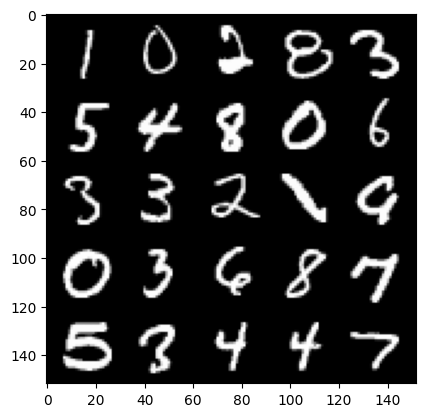

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.639533416748048, discriminator loss: 0.04716523222252733


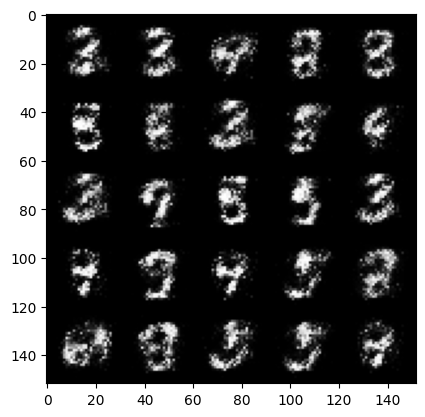

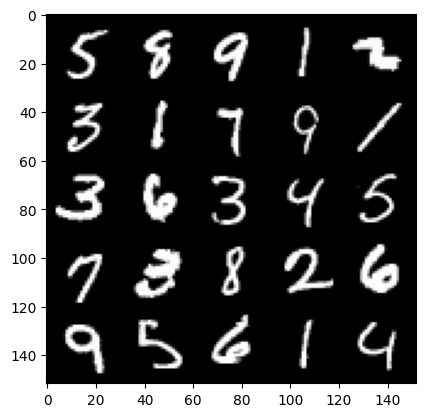

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.754393938064579, discriminator loss: 0.04160018020309509


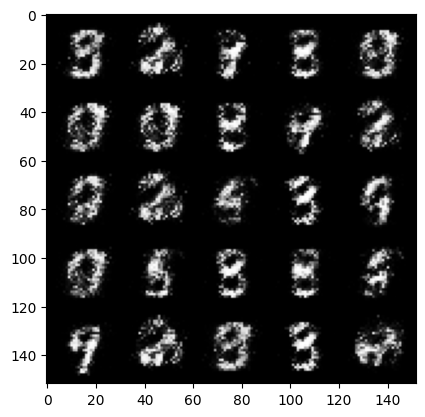

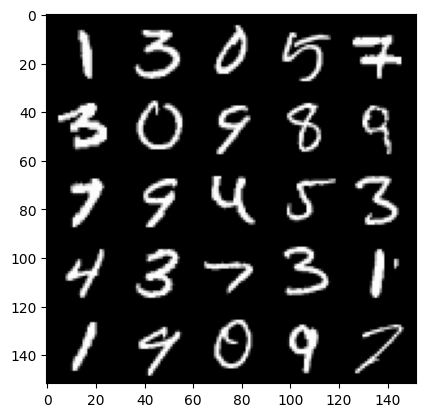

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.453722399234775, discriminator loss: 0.05648619732260704


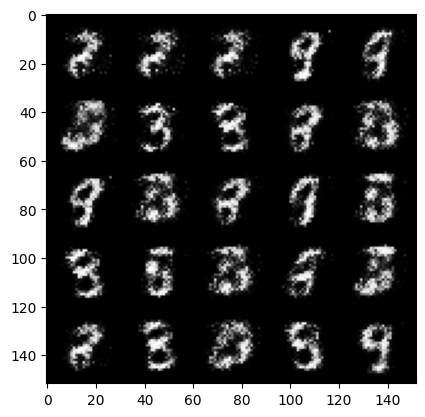

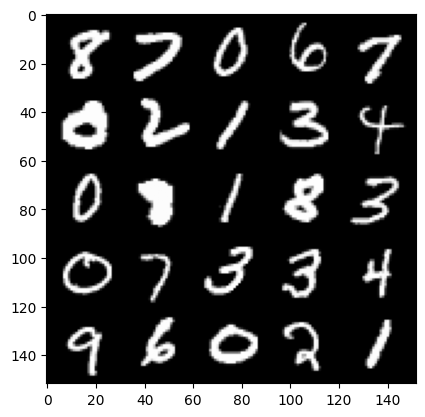

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.547685689926146, discriminator loss: 0.059724876087158874


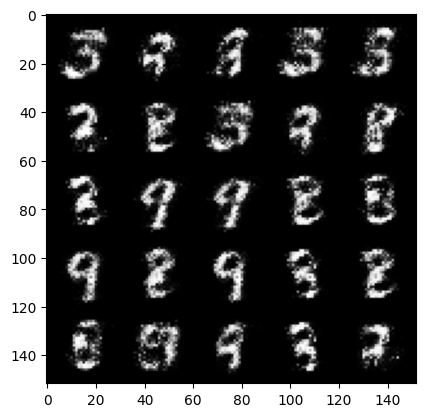

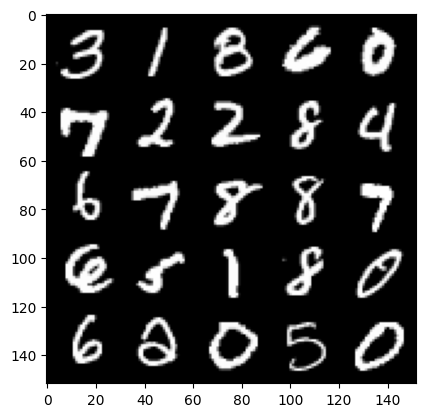

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.3596370596885725, discriminator loss: 0.07095957044512027


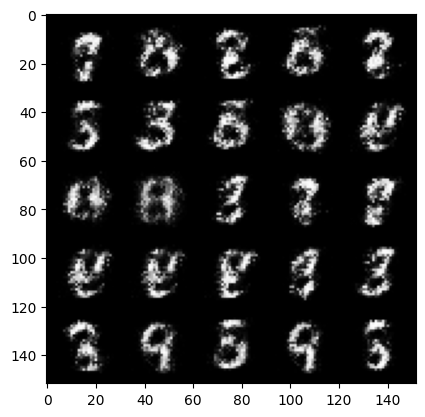

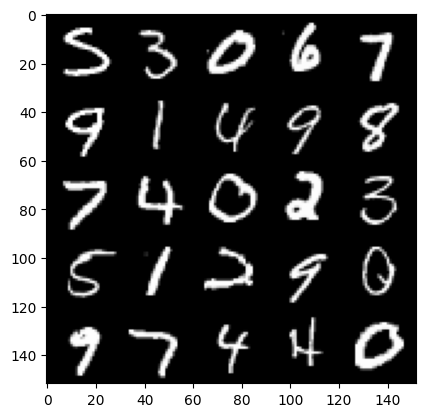

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 4.111161256790158, discriminator loss: 0.08742509020119901


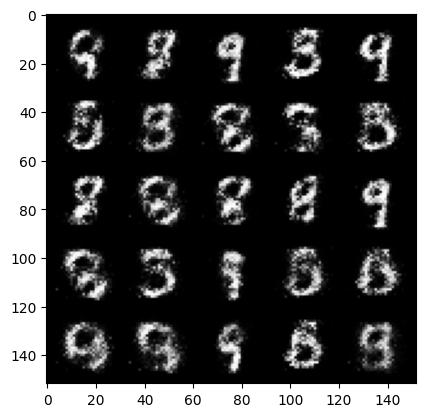

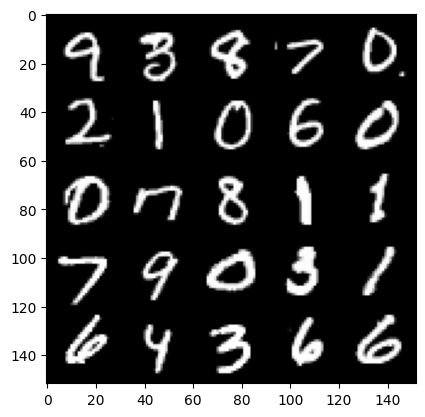

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.075575428009034, discriminator loss: 0.08842935717105871


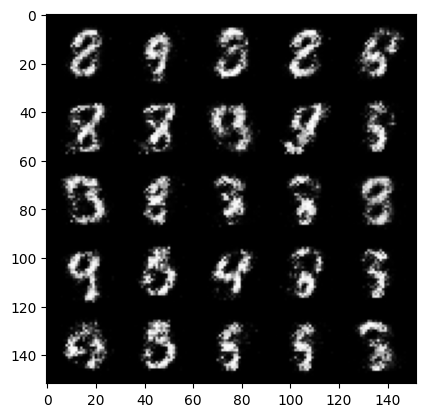

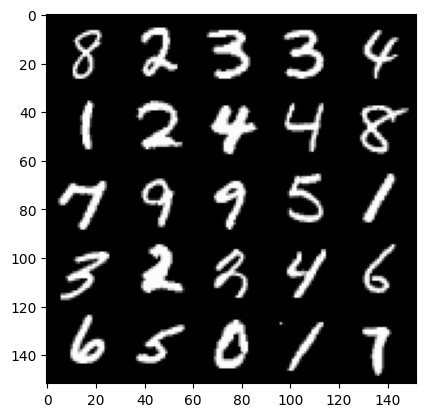

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 4.242204168319705, discriminator loss: 0.07530163126438855


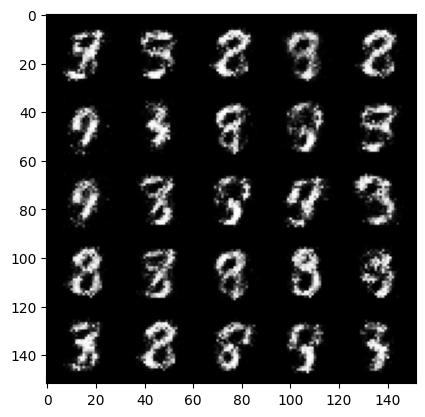

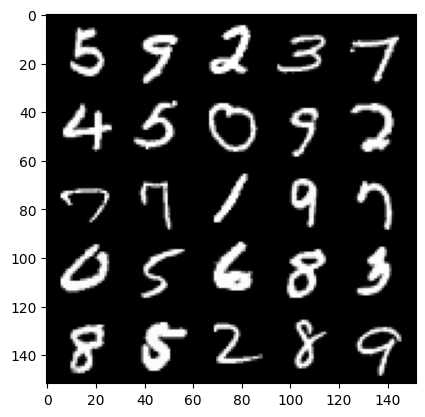

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 4.186517825603484, discriminator loss: 0.08033771723508841


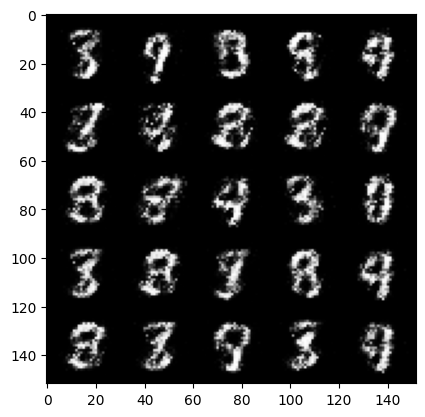

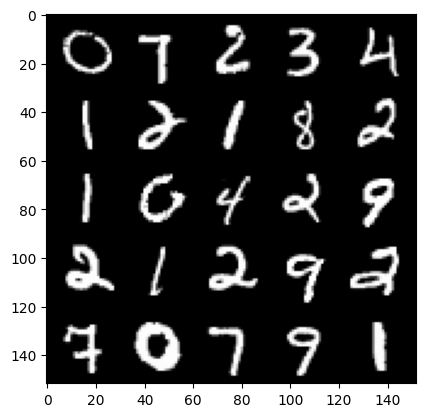

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.9439031224250787, discriminator loss: 0.09157241023331868


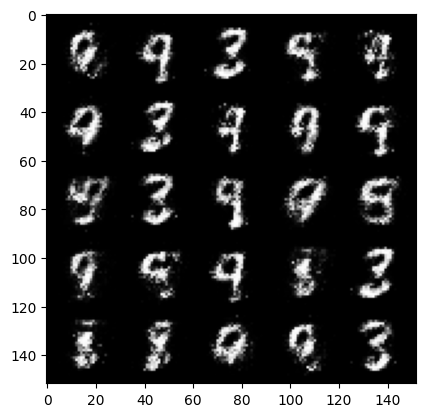

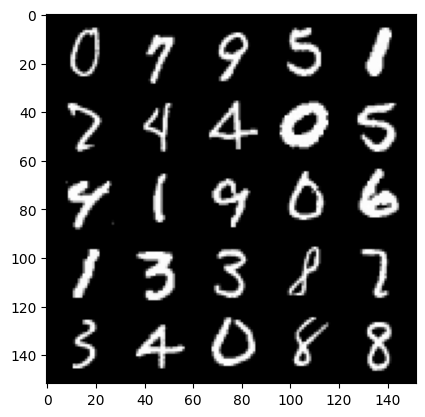

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.963918281078337, discriminator loss: 0.0908215708807111


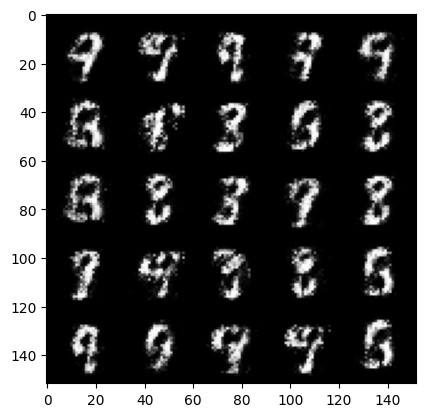

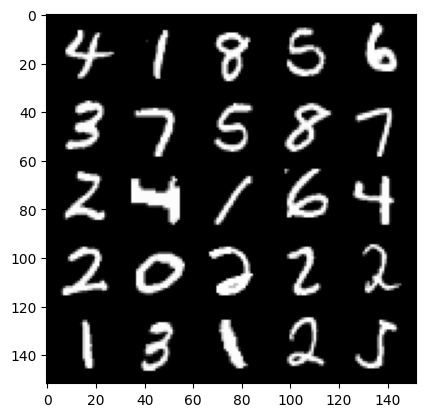

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 4.007716296672822, discriminator loss: 0.09051302760839464


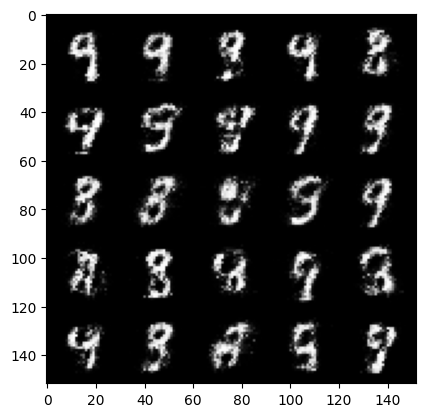

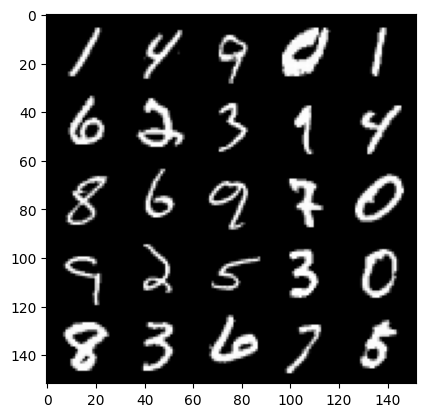

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.859765192985532, discriminator loss: 0.10910972030460833


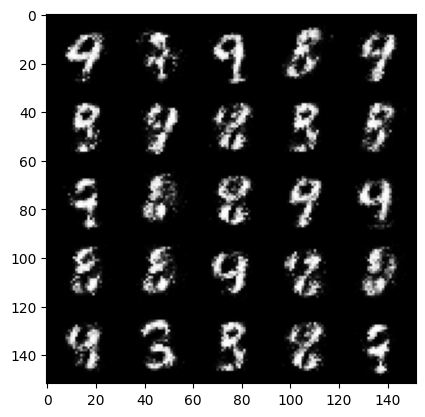

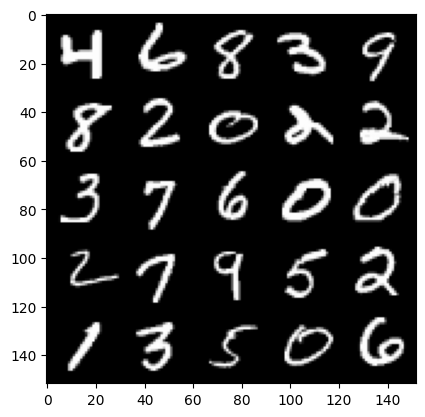

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.831923548698424, discriminator loss: 0.11092702256143093


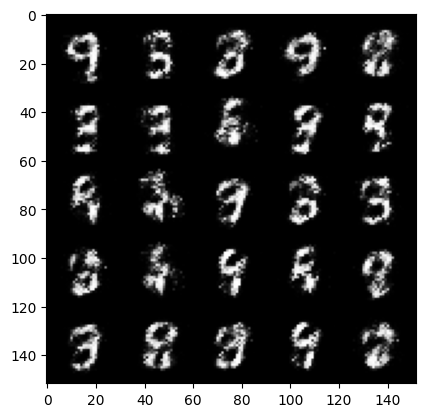

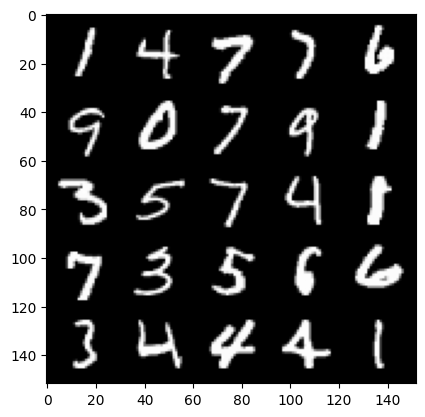

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.6110886292457565, discriminator loss: 0.12682640497386455


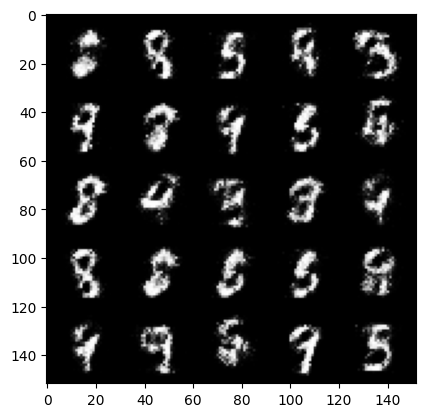

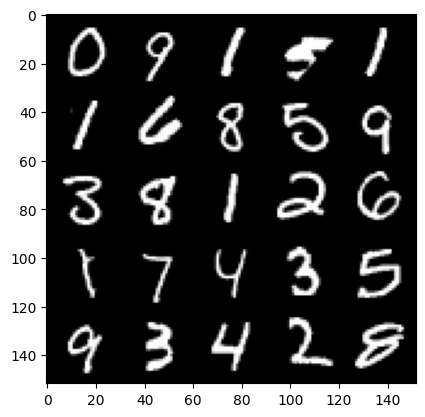

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.506256238937379, discriminator loss: 0.1379525996893643


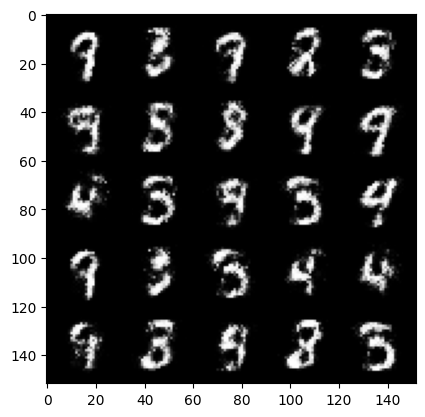

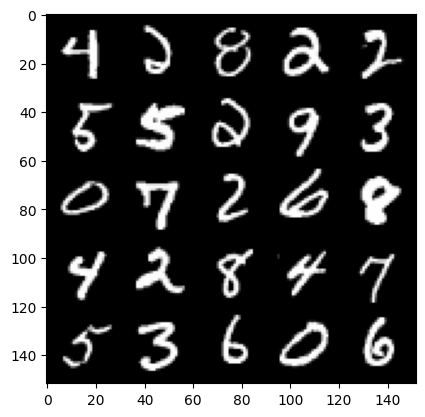

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.3362020516395585, discriminator loss: 0.14252004325389886


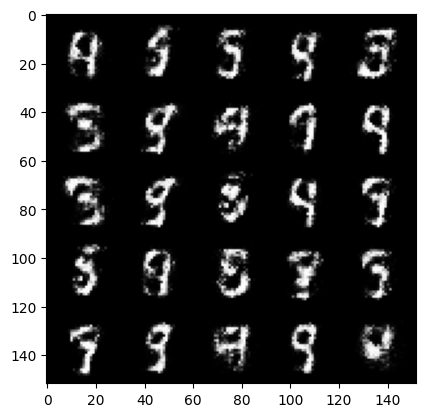

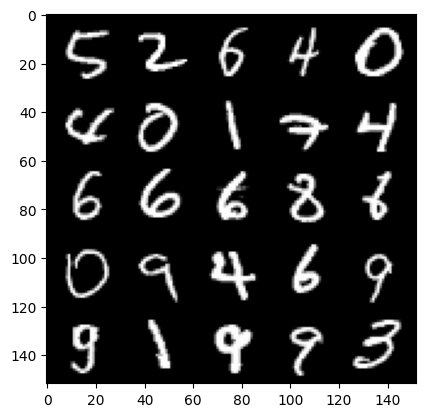

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.3155713548660284, discriminator loss: 0.14574171996116658


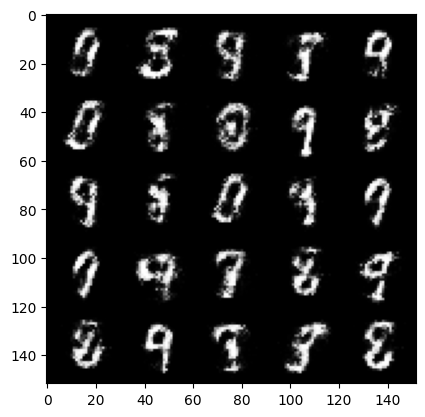

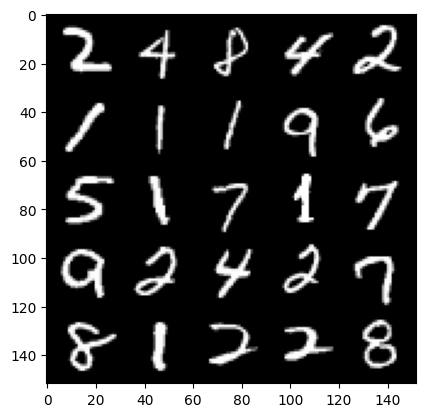

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.257353371620177, discriminator loss: 0.15623862957954415


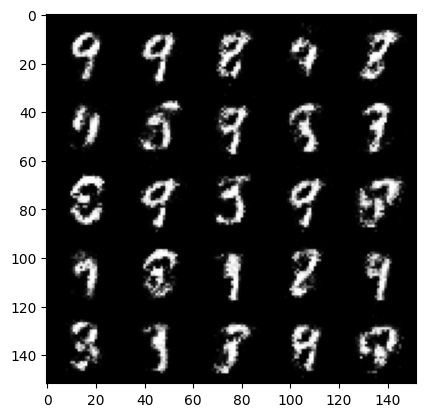

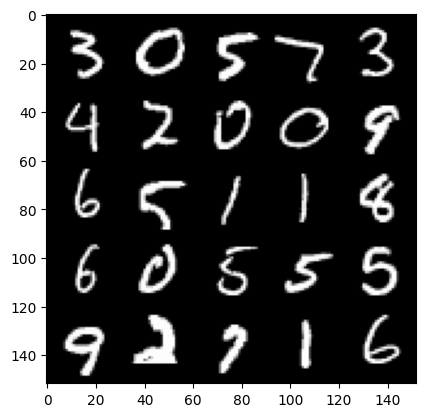

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.379640573024752, discriminator loss: 0.13797879420220868


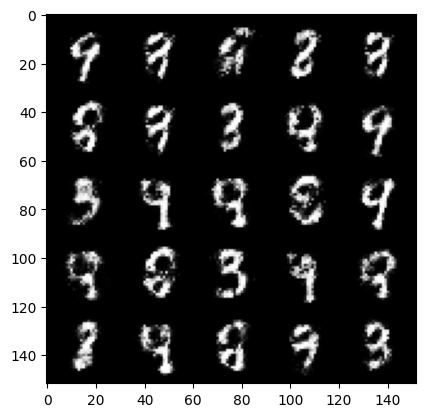

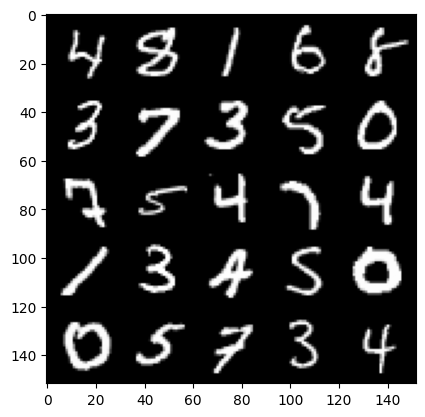

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.2998827180862405, discriminator loss: 0.14940087752044204


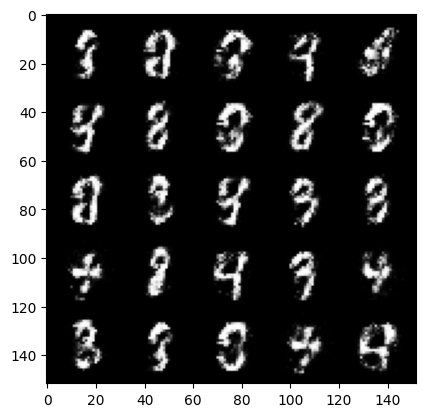

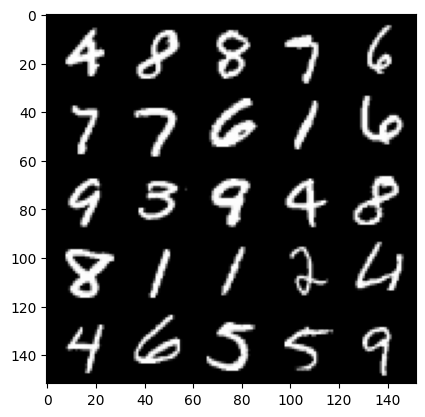

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.16297130203247, discriminator loss: 0.16204278725385673


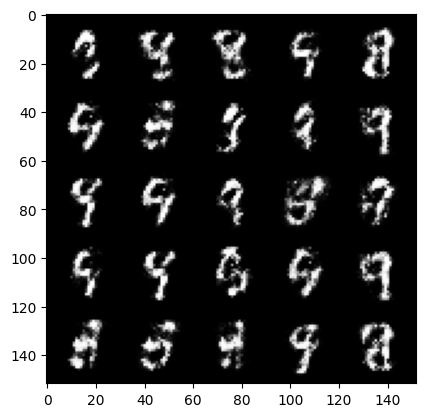

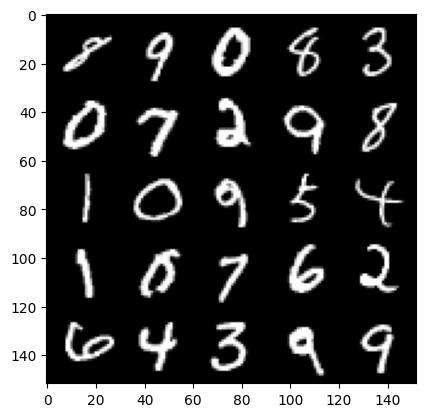

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.126325306892394, discriminator loss: 0.15727388623356808


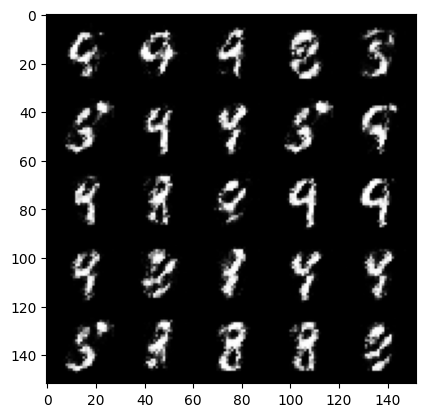

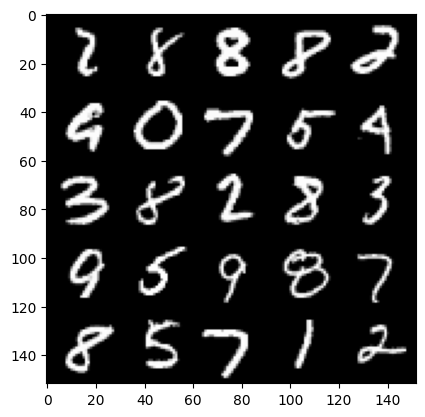

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.068713641166687, discriminator loss: 0.16928749912977226


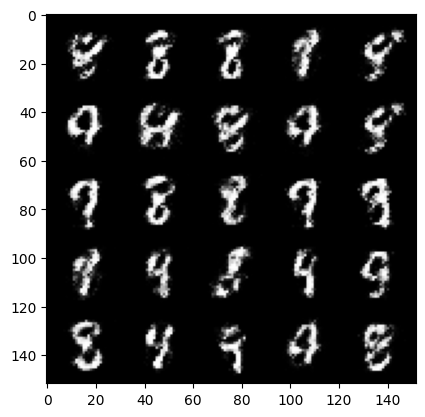

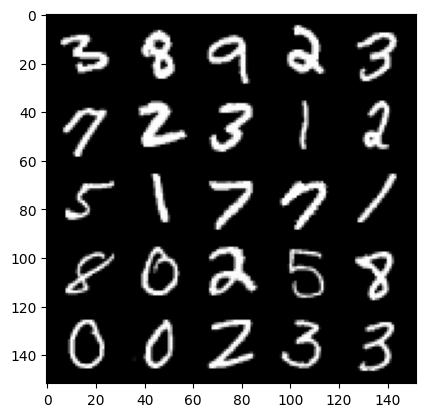

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.0392572627067556, discriminator loss: 0.16929848918318743


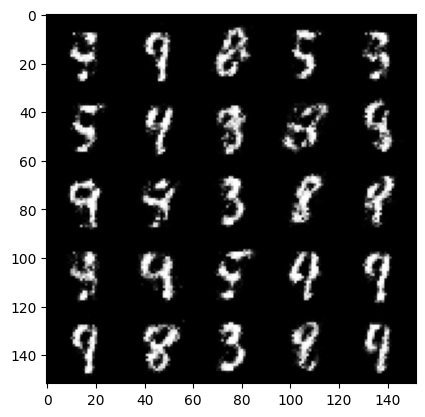

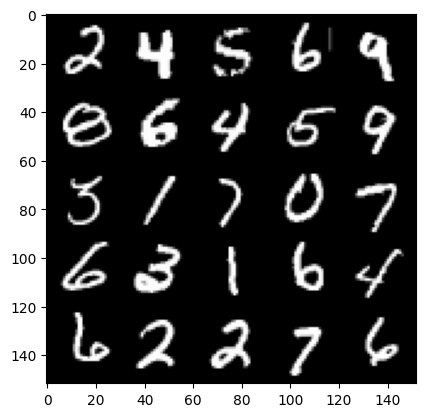

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 2.9559905486106874, discriminator loss: 0.18168287427723406


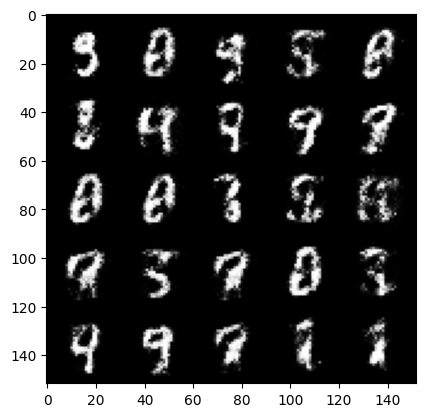

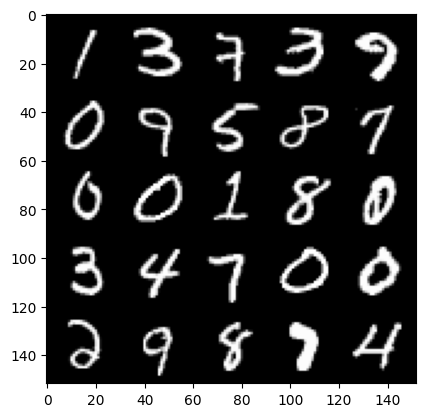

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 2.927599817276001, discriminator loss: 0.1754496423304081


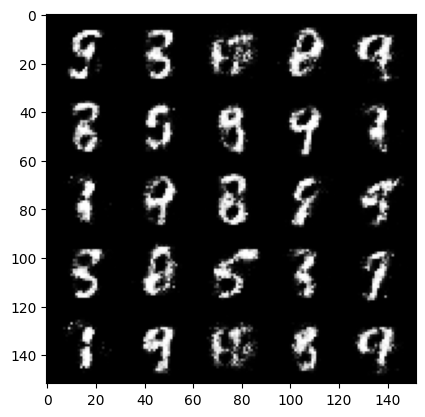

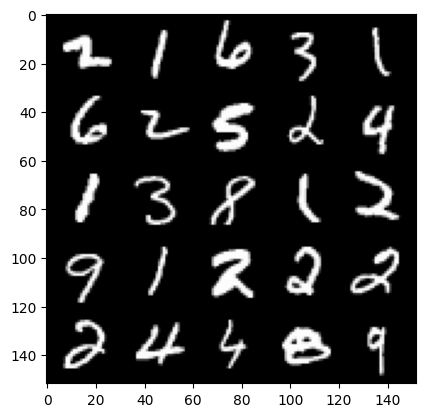

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 2.9223595056533784, discriminator loss: 0.1845864721536639


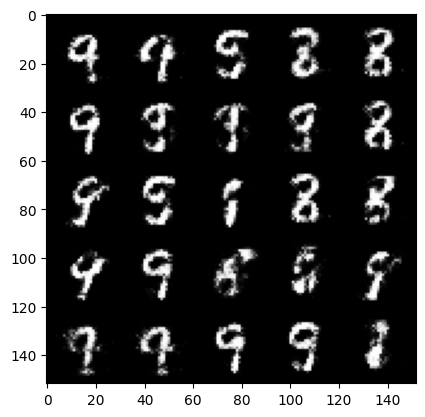

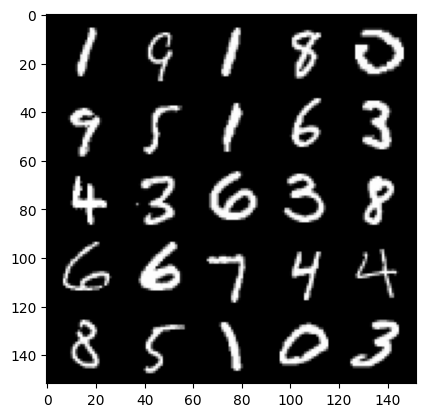

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.048464181900024, discriminator loss: 0.1662548017948867


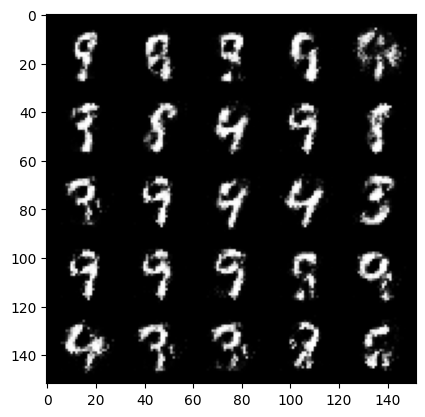

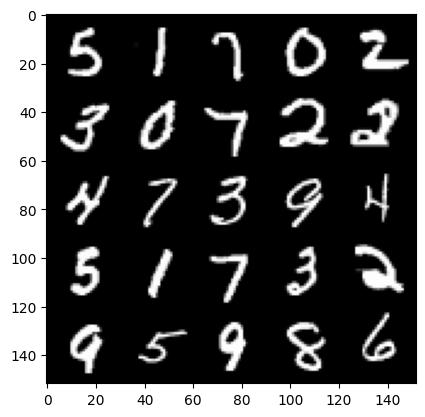

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.801393609523776, discriminator loss: 0.191996597930789


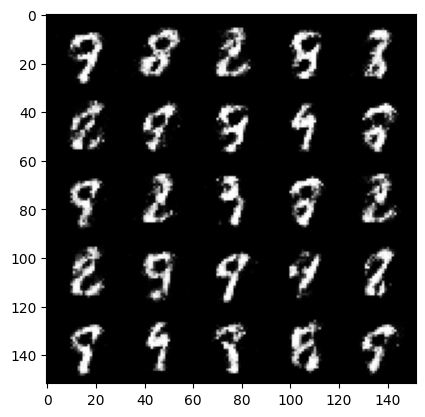

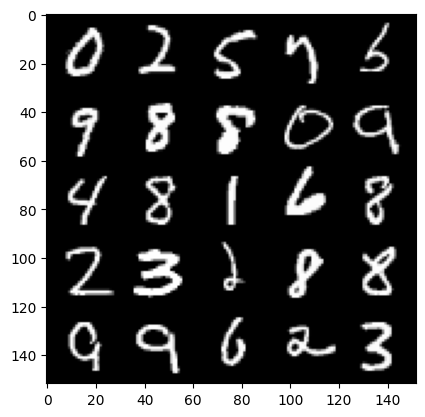

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.854412126541135, discriminator loss: 0.19929874974489215


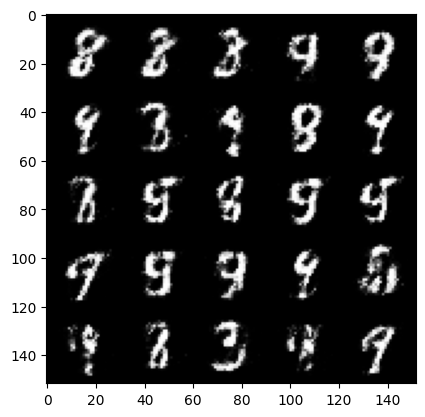

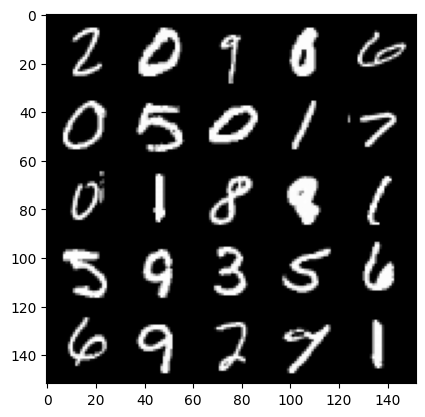

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.7344301567077656, discriminator loss: 0.19913953718543048


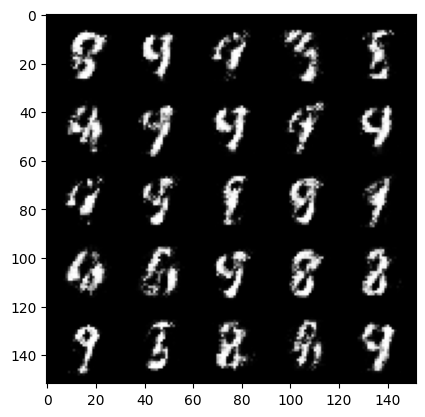

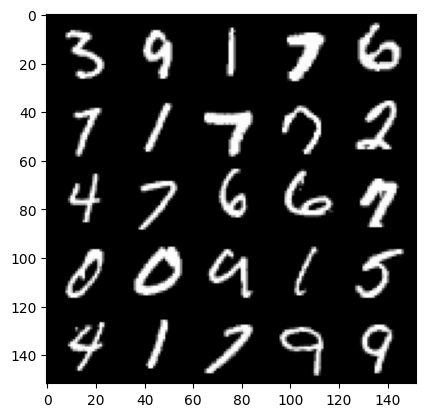

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.6184952502250693, discriminator loss: 0.22268479751050455


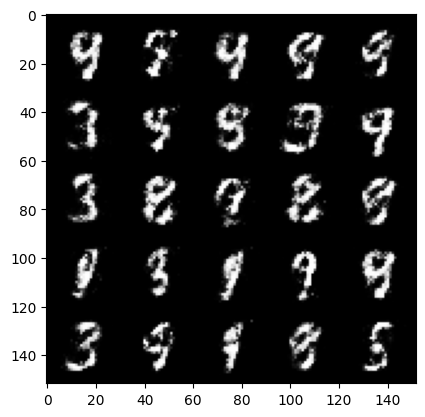

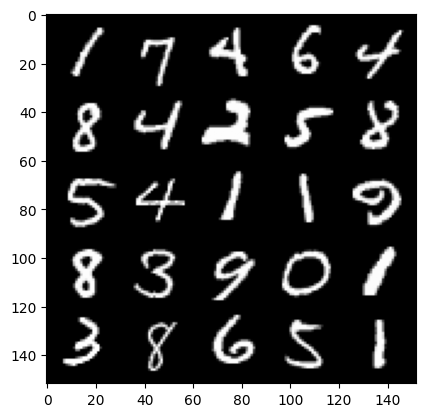

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.587052844047545, discriminator loss: 0.218854281514883


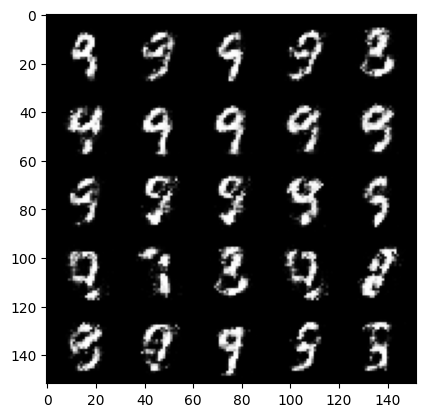

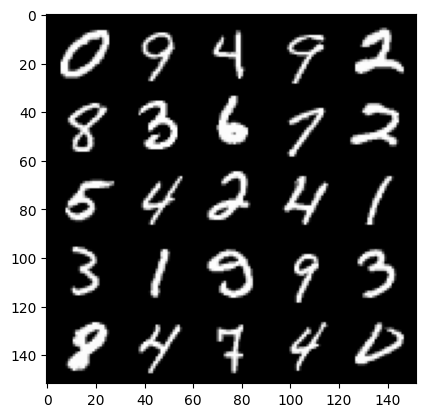

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.6172436966896075, discriminator loss: 0.22511426845192906


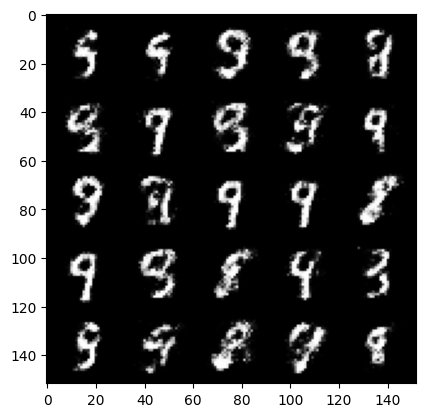

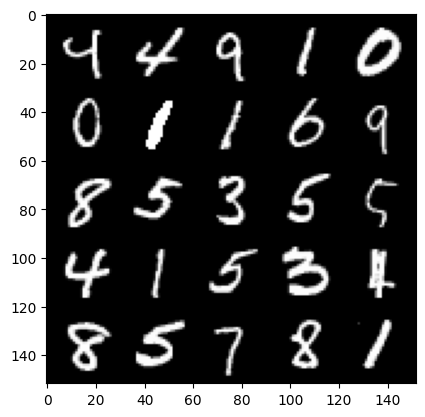

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.609462426185605, discriminator loss: 0.21891575382649883


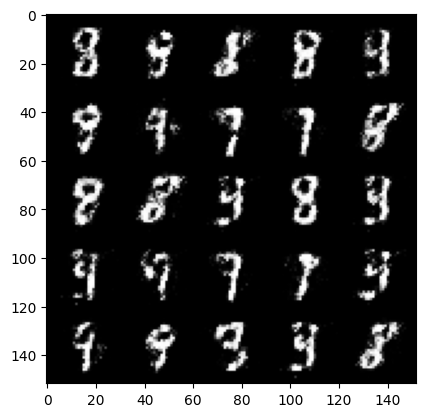

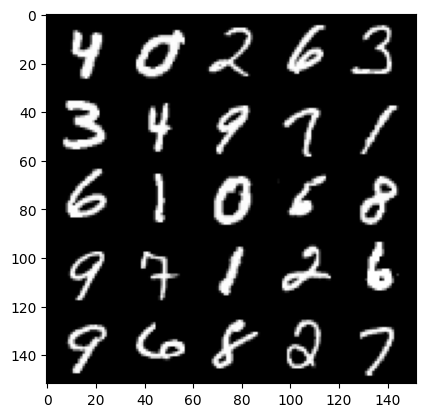

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.502130517959594, discriminator loss: 0.2374660057723522


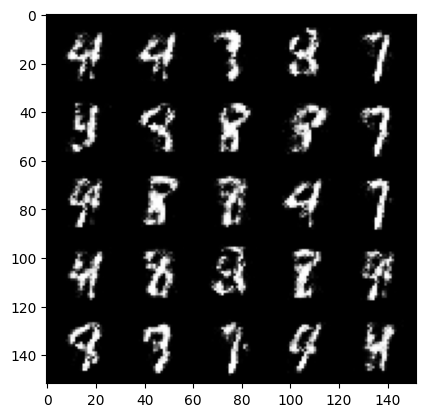

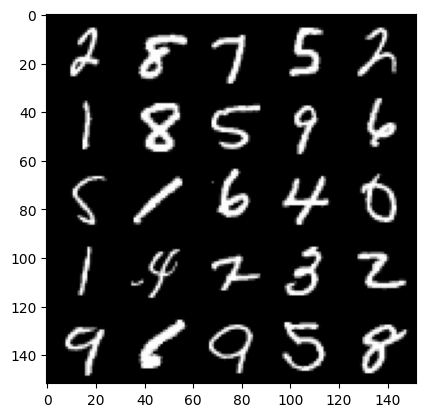

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.4833451483249687, discriminator loss: 0.23978276705741866


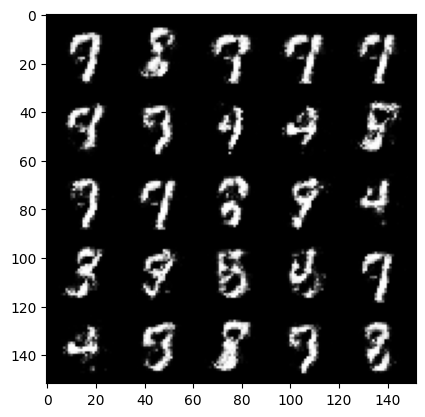

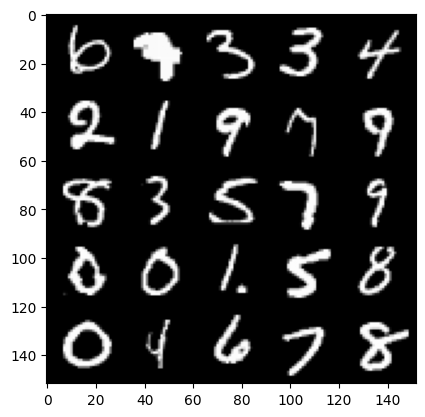

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.3547841949462907, discriminator loss: 0.25099263289570795


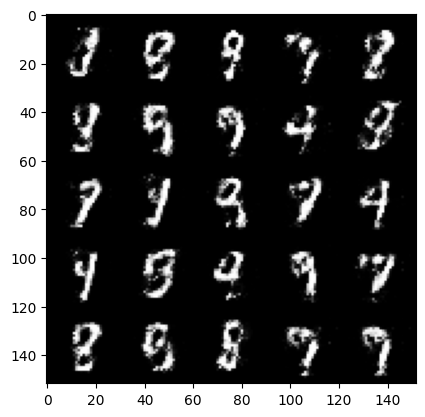

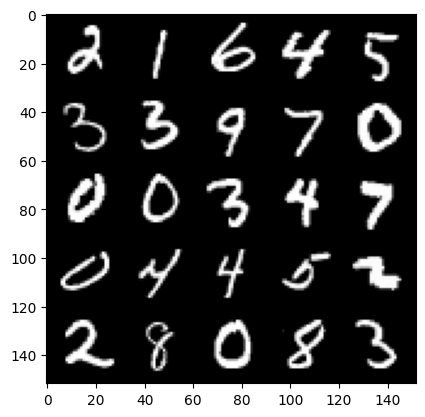

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.4645009925365455, discriminator loss: 0.23697653484344477


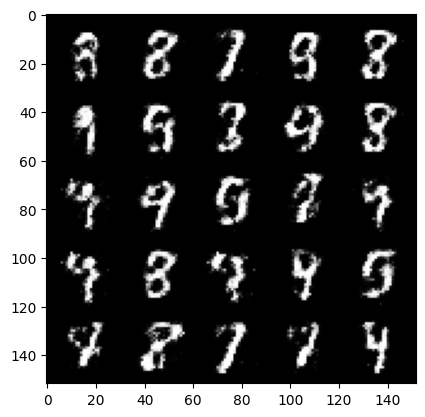

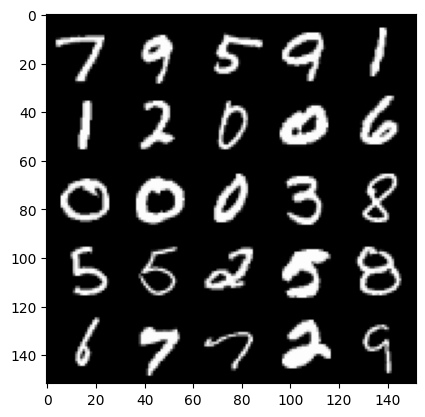

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.4617203011512756, discriminator loss: 0.24440958924591544


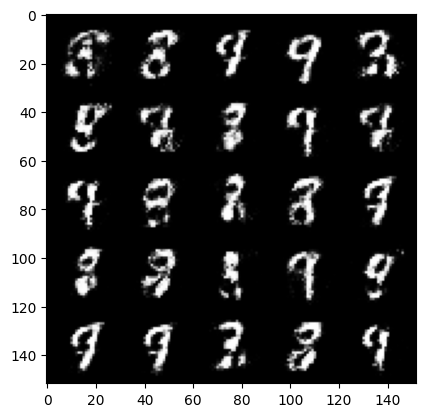

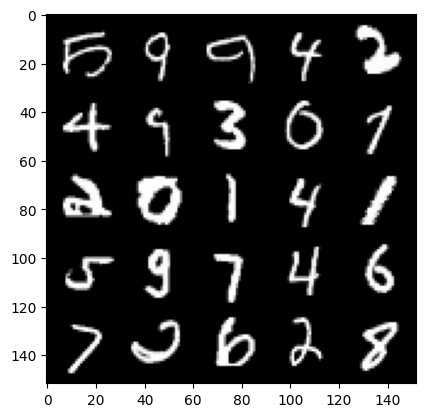

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.4213976721763615, discriminator loss: 0.2500328347086909


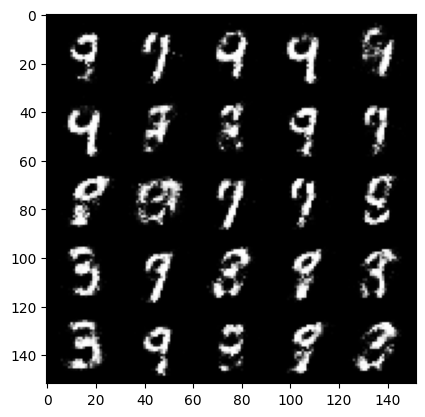

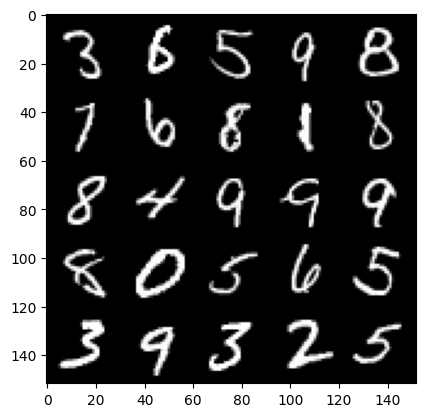

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.4924391341209406, discriminator loss: 0.23254059287905707


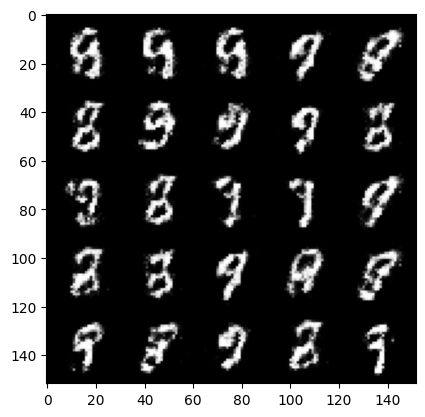

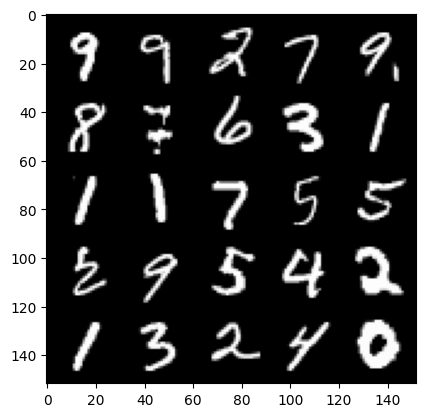

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.4518623166084272, discriminator loss: 0.247563495218754


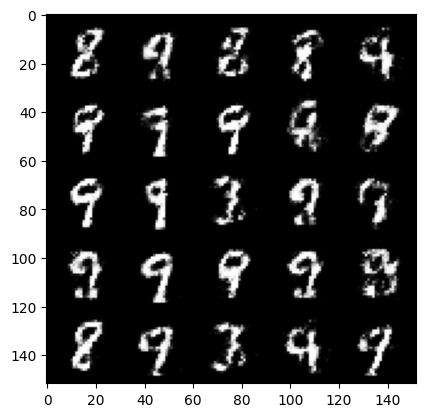

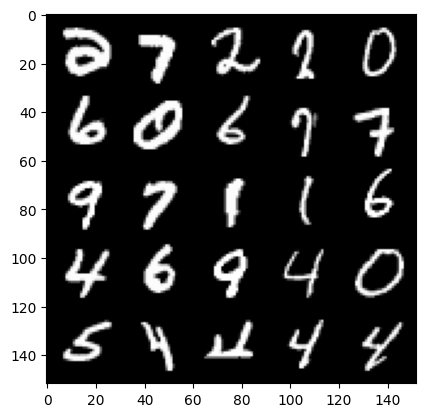

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.4977675423622143, discriminator loss: 0.22372885514795784


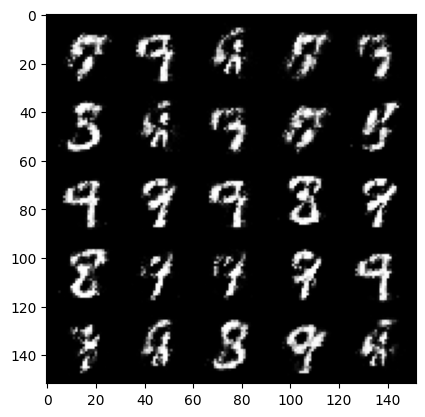

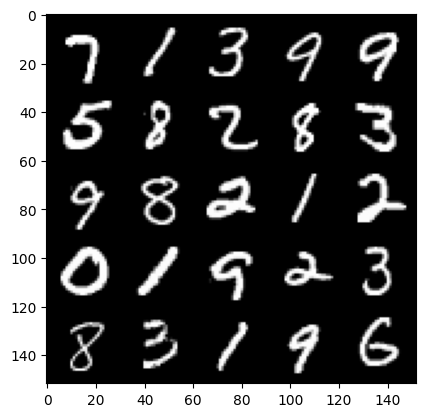

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.3796818628311147, discriminator loss: 0.2603145757615568


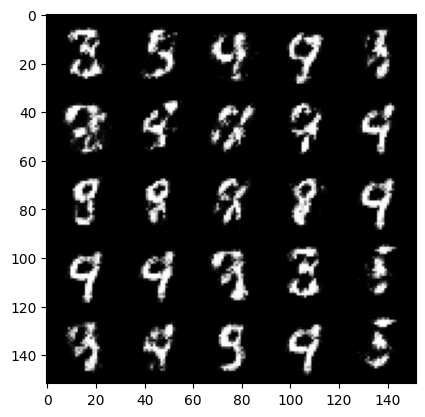

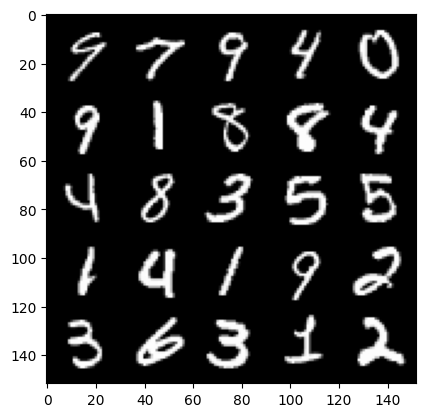

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.276185038566588, discriminator loss: 0.2546759321987631


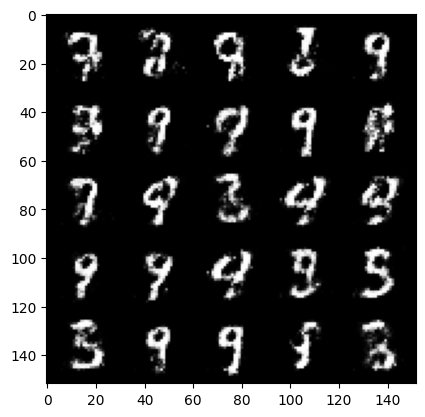

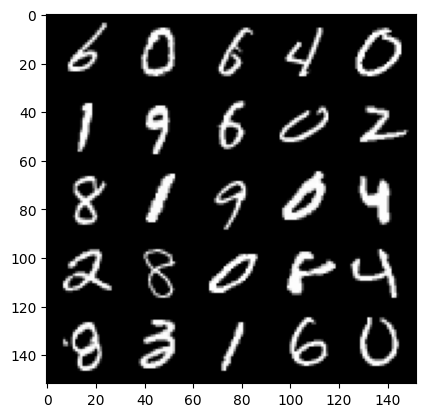

In [ ]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):

    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don’t get any runtime errors, that means your code works.

Congratulations, you trained your GAN! 🎉
